### Tweeter NLP Data
#### 1. Imports and EDA

In [1]:
# !pip install scikit-learn-intelex
# !pip freeze | grep -E 'ydata-profiling|visions'

In [2]:
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
from ydata_profiling.config import Settings

import nltk
from nltk.corpus import stopwords
import re
import os
import joblib
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Sklearn imports
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.decomposition import TruncatedSVD
from sklearn.compose import ColumnTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline

# Classification models
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# For classification metrics
from sklearn.metrics import classification_report

# For dealing with imbalanced data
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline

# Naive Bayes
from sklearn.naive_bayes import MultinomialNB

# Support Vector Optimizers
from sklearnex import patch_sklearn
patch_sklearn()
from sklearn.svm import SVC

from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import TruncatedSVD

config = Settings()
# Disable chi-square test for numeric variables
config.vars.num.chi_squared_threshold = 0.0

%load_ext autoreload
%autoreload 2
%matplotlib inline

df_raw = pd.read_csv('./data/nlp_tweet/tweet_data.csv')
df = df_raw.copy()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)


In [3]:
df.sample(15).T

,667073,249146,454621,354517,634941,646164,372664,347671,14613,324744,640734,338759,420294,214857,707646
tweetID,1143945291676168192,1102256077410840577,1123204633021886464,1112898622058840064,1141631792010670080,1142547810555813889,1114716979997417473,1112172796443004928,1073050878351822853,1109958325305778177,1141802081734594560,1111303197665251328,1119524272924499968,1098395646841638912,1147942854842617857
crDate,2019-06-26 18:13:05,2019-03-03 17:15:02,2019-04-30 12:37:07,2019-04-02 02:04:42,2019-06-20 09:00:04,2019-06-22 21:40:00,2019-04-07 02:30:13,2019-03-31 02:00:32,2018-12-13 03:04:00,2019-03-24 23:21:01,2019-06-20 20:16:44,2019-03-28 16:25:03,2019-04-20 08:52:41,2019-02-21 01:35:04,2019-07-07 18:57:58
edInput,-1,1,2,-1,-1,-1,1,-1,-1,2,1,-1,1,-1,-1
editor,-1,5004,5003,-1,-1,-1,5003,-1,-1,5004,5006,-1,5004,-1,-1
engages,760,63,650,13,69,94,1411,1374,579,68,127,16,267,22,39
isApproved,True,True,False,False,False,False,True,False,False,False,True,False,True,False,False
isEdNeed,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
isRT,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False
likes,584,43,491,12,40,74,1082,1087,371,50,70,12,160,15,30
photoUrl,NaN,NaN,NaN,NaN,https://pbs.twimg.com/media/D9fkEIhX4AUTVwt.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
# Runs Auto-EDA of data, see tweet_EDA_report.html in project folder magnimind_projects
profile = ProfileReport(df, title='Tweet Profile Report', explorative=True, config=config)
profile.to_file('tweet_EDA_report.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### 2. Feature Selections and Word Cloud

In [5]:
df_reduced = df[['editor', 'topicName', 'text', 'edInput']].copy()
df_reduced.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 785916 entries, 0 to 785915
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   editor     785916 non-null  int64 
 1   topicName  785916 non-null  object
 2   text       785916 non-null  object
 3   edInput    785916 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 24.0+ MB


In [6]:
# nltk.download('stopwords')

In [7]:
stop_words = set(stopwords.words('english'))

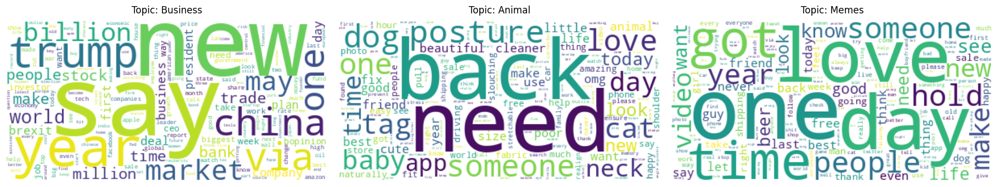

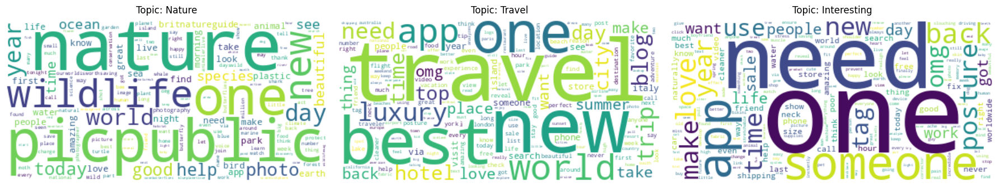

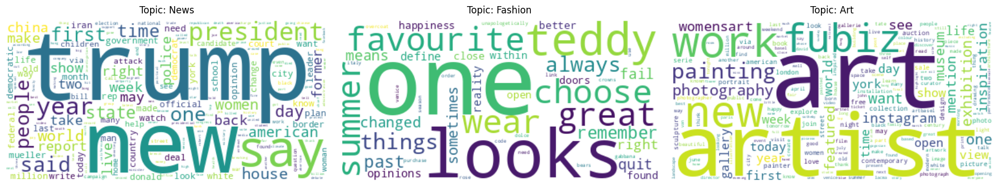

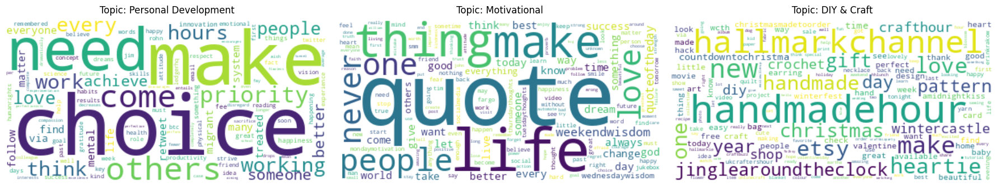

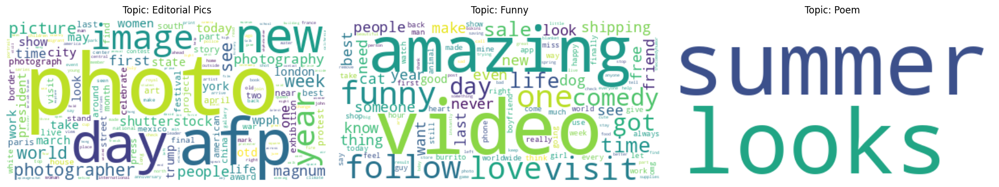

...

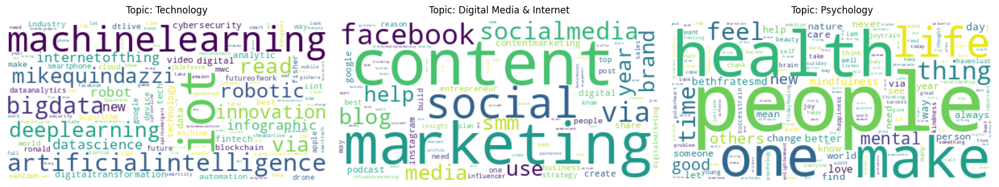

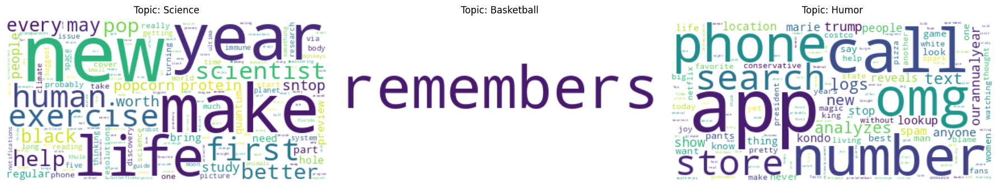

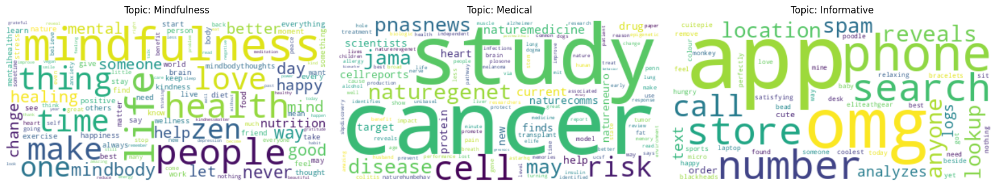

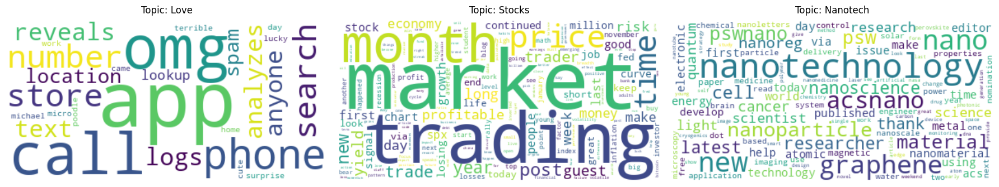

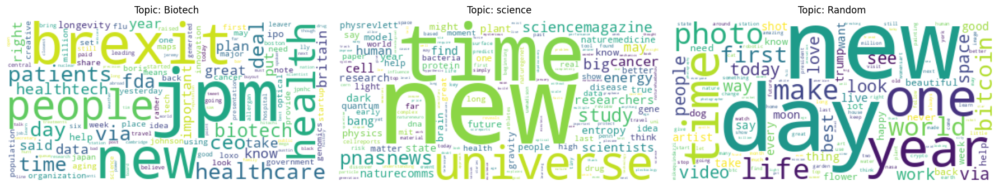

In [8]:
# Define a text-cleaning function
# Generate word clouds for each topicName
# We group rows by topicName, concatenate the cleaned text, and make a WordCloud.

stop_words = set(stopwords.words('english'))

def cleanup_text(text):
    # Remove URLs
    text = re.sub(r'https?://\S+', '', text)
    # Keep only letters + whitespace; make lowercase
    text = re.sub(r'[^a-zA-Z\s]', ' ', text).lower()
    # Tokenize on whitespace
    tokens = text.split()
    # Remove stopwords
    tokens = [t for t in tokens if t not in stop_words]
    # Keep tokens > 2 characters, purely alphabetical
    tokens = [t for t in tokens if t.isalpha() and len(t) > 2]
    return ' '.join(tokens)

df_reduced['cleaned_text'] = df_reduced['text'].apply(cleanup_text)

topics = df_reduced['topicName'].unique()

chunk_size = 3
for i in range(0, len(topics), chunk_size):
    # For this figure, grab up to 3 topics
    chunk = topics[i:i+chunk_size]
    
    # Create one figure to hold up to 3 columns
    # Adjust figsize as you like
    fig = plt.figure(figsize=(18, 6))

    for j, topic in enumerate(chunk):
        # Gather text for this topic
        group = df_reduced[df_reduced['topicName'] == topic]
        all_text = " ".join(group['cleaned_text'])
        
        # Generate the word cloud
        wordcloud = WordCloud(background_color='white', 
                              collocations=False
                             ).generate(all_text)
        
        # Manually place an Axes in the figure:
        # e.g., 3 columns => each ~0.33 wide
        left = 0.01 + 0.33*j   # shift each axis horizontally
        ax = fig.add_axes([left, 0.05, 0.32, 0.85]) 
        ax.imshow(wordcloud, interpolation='bilinear')
        ax.set_title(f"Topic: {topic}", pad=10)
        ax.axis("off")
    
    # Show the figure for this set of 3 topics
    plt.show()
    plt.close(fig)

### 3. Predict edInput

In [9]:
df_model = df_reduced[['editor', 'topicName', 'cleaned_text', 'edInput']].copy()
print(f'{df_model.info()}\n')
##############################################################################
# 1. DATA PREP (Assume df_model has "editor", "topicName", "cleaned_text", "edInput")
##############################################################################

# For example: map y from {1,2,3} => {0,1,2} if not already done
df_model['edInput'] = df_model['edInput'].replace({-1:3, 3:3, 4:3}).copy()  # (-1,3,4 => 3; 1 => 1; 2 => 2)
df_model['edInput'] = df_model['edInput'].replace({1:0, 2:1, 3:2}).copy()
print(f'{df_model['edInput'].value_counts()}')

X = df_model[['editor', 'topicName', 'cleaned_text']]
y = df_model['edInput']

# Split into train/test
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.1,       
    random_state=42,
    stratify=y
)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 785916 entries, 0 to 785915
Data columns (total 4 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   editor        785916 non-null  int64 
 1   topicName     785916 non-null  object
 2   cleaned_text  785916 non-null  object
 3   edInput       785916 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 24.0+ MB
None

edInput
2    463598
0    215577
1    106741
Name: count, dtype: int64


In [10]:
##############################################################################
# 2. PREPROCESSOR (TF-IDF -> TruncatedSVD -> MinMaxScaler, plus OHE for cat)
##############################################################################

text_pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(max_features=350)),
    ('svd', TruncatedSVD(n_components=11)),
    ('minmax', MinMaxScaler(feature_range=(0,1)))
])

cat_pipeline = Pipeline([
    ('ohe', OneHotEncoder(handle_unknown='ignore', sparse_output=True))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('text', text_pipeline, 'cleaned_text'),
        ('cat',  cat_pipeline,  ['editor', 'topicName'])
    ],
    remainder='drop'
)


In [11]:
##############################################################################
# 3. DEFINE MODELS AND PARAM GRIDS
##############################################################################

# We'll do a dictionary: { model_name: (model, param_grid) }
# Adjust the ranges to what makes sense for your data!

models_and_grids = {
    'LogisticRegression': (
        LogisticRegression(
            max_iter=1000,
            class_weight={0:1, 1:2, 2:1}  # multi-class weighting
        ),
        {
            'classifier__C': [0.1, 1, 10]
        }
    ),
    'RandomForest': (
        RandomForestClassifier(
            class_weight={0:1, 1:2, 2:1},
            n_jobs=-1
        ),
        {
            'classifier__n_estimators': [100, 200],
            'classifier__max_depth': [10, 20, None]
        }
    ),
    'XGBoost': (
        XGBClassifier(
            use_label_encoder=False,
            eval_metric='mlogloss',
            n_jobs=-1
            # class_weight not used for multi-class
        ),
        {
            'classifier__learning_rate': [0.01, 0.1],
            'classifier__max_depth': [6, 10]
        }
    ),
    'SGDClassifier': (
        SGDClassifier(
            loss='hinge',  # linear SVM-like
            penalty='l2',
            random_state=42,
            n_jobs=-1
        ),
        {
            'classifier__alpha': [1e-4, 1e-3, 1e-2],
            'classifier__max_iter': [1000, 2000]
        }
    ),
    # Include or remove Naive Bayes as you wish
    'NaiveBayes': (
        MultinomialNB(), 
        {
            # NB doesn't support class_weight, can still use SMOTE for minority classes
            'classifier__alpha': [1.0, 0.1, 0.01]
        }
    )
}

##############################################################################
# 4. CREATE ./models DIRECTORY IF NOT EXISTS
##############################################################################
os.makedirs("./models", exist_ok=True)


In [12]:
##############################################################################
# 5. GRID SEARCH OVER EACH MODEL, SAVE BEST ESTIMATOR
##############################################################################
# from sklearn.model_selection import StratifiedKFold

# # Use an imblearn pipeline so we can do SMOTE + classifier
# # We'll only vary 'classifier__...' params in param_grid

# # We do a simple 3-fold CV. Tweak as desired.
# cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# for model_name, (model, param_grid) in models_and_grids.items():
#     print(f"\n=== Grid Searching: {model_name} ===")
    
#     pipeline = ImbPipeline([
#         ('preprocessor', preprocessor),
#         ('smote', SMOTE()),   # Oversample minority classes
#         ('classifier', model)
#     ])
    
#     # For multi-class tasks, you might want 'f1_macro' or 'accuracy'
#     # Adjust scoring as you prefer
#     grid_search = GridSearchCV(
#         pipeline,
#         param_grid=param_grid,
#         scoring='f1_macro',
#         cv=cv,
#         n_jobs=-1,         # parallel search
#         verbose=1
#     )
    
#     grid_search.fit(X_train, y_train)
    
#     print("Best Params:", grid_search.best_params_)
#     print("Best CV Score:", f"{grid_search.best_score_:.3f}")
    
#     # Save the best estimator (including pipeline steps)
#     best_model_path = f"./models/{model_name}_best.joblib"
#     joblib.dump(grid_search.best_estimator_, best_model_path)
#     print(f"Saved best {model_name} to {best_model_path}")

In [13]:
##############################################################################
# 6. LOAD THE BEST ESTIMATORS AND PRINT CLASSIFICATION REPORTS
##############################################################################
for model_name in models_and_grids.keys():
    best_model_path = f"./models/{model_name}_best.joblib"
    print(f"\n=== Loading best {model_name} ===")
    best_pipeline = joblib.load(best_model_path)
    
    # Predict on the test set
    y_pred = best_pipeline.predict(X_test)
    
    # Show classification metrics
    print(f"Classification Report for {model_name}:")
    print(classification_report(y_test, y_pred))


=== Loading best LogisticRegression ===
Classification Report for LogisticRegression:
              precision    recall  f1-score   support

           0       0.81      0.45      0.58     21558
           1       0.40      0.90      0.55     10674
           2       1.00      0.92      0.96     46360

    accuracy                           0.78     78592
   macro avg       0.74      0.75      0.69     78592
weighted avg       0.87      0.78      0.80     78592


=== Loading best RandomForest ===
Classification Report for RandomForest:
              precision    recall  f1-score   support

           0       0.77      0.73      0.75     21558
           1       0.54      0.73      0.62     10674
           2       0.99      0.93      0.96     46360

    accuracy                           0.85     78592
   macro avg       0.76      0.80      0.78     78592
weighted avg       0.87      0.85      0.85     78592


=== Loading best XGBoost ===
Classification Report for XGBoost:
           

In [14]:
# Classification: 
# 0 = 1, 1 = 2, 3 = {-1, 3, 4}

### Narrow ML Definition
1. Focus on limited topicNames, business, news, etc...
2. edInput limit to 1 and 2
3. Refactor certain stopwords 
4. Reduce number fo models
5. Show confusion matrix

In [15]:
df2 = df_raw.copy()

In [16]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 785916 entries, 0 to 785915
Data columns (total 18 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   tweetID     785916 non-null  int64 
 1   crDate      785916 non-null  object
 2   edInput     785916 non-null  int64 
 3   editor      785916 non-null  int64 
 4   engages     785916 non-null  int64 
 5   isApproved  785916 non-null  bool  
 6   isEdNeed    785916 non-null  bool  
 7   isRT        785916 non-null  bool  
 8   likes       785916 non-null  int64 
 9   photoUrl    277896 non-null  object
 10  retweets    785916 non-null  int64 
 11  rtUsID      785916 non-null  int64 
 12  text        785916 non-null  object
 13  topicName   785916 non-null  object
 14  usFlwrs     785916 non-null  int64 
 15  usID        785916 non-null  int64 
 16  usName      785916 non-null  object
 17  videoUrl    140491 non-null  object
dtypes: bool(3), int64(9), object(6)
memory usage: 92.2+ MB


In [17]:
# topicName selections
df2['topicName'].value_counts()

topicName
Business                    164602
News                        131973
Motivational                 84750
Technology                   47679
Design & Architecture        44987
Cryptocurrency               38623
Art                          36697
Interesting                  28615
Animal                       28202
Memes                        26349
Nature                       25021
Photography                  23638
DIY & Craft                  22392
Space                        14226
Funny                        13654
Travel                       13215
Random                       11825
Editorial Pics               11026
Flowers                       9450
Mindfulness                   2779
Fitness                       2454
Nanotech                       792
World Leaders                  663
Psychology                     544
US News                        279
science                        244
Stocks                         188
Humor                          154
Spirituali

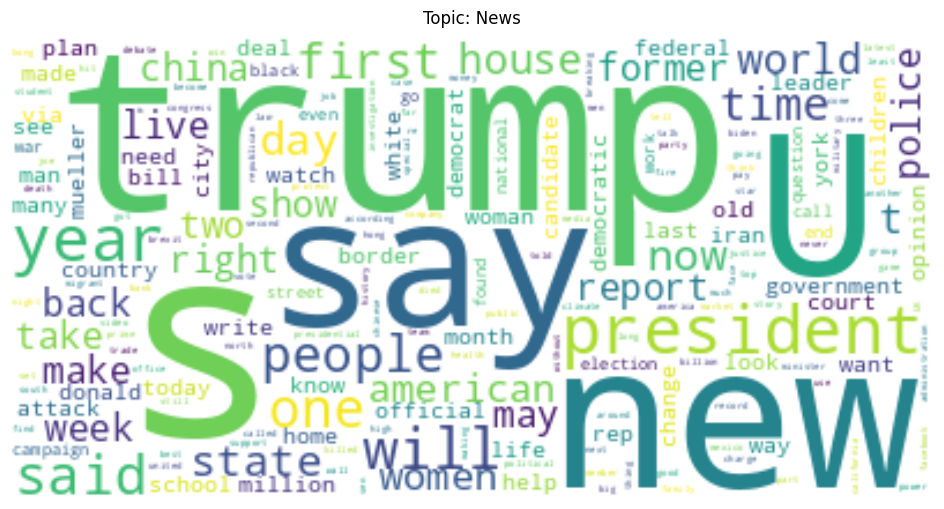

In [20]:
################
# Work on News #
################

# Get needed features
df_news = df2[['topicName', 'text', 'edInput']].copy()

# Filter df2 for rows with topicName 'News' or 'US News'
df_news = df_news[df_news['topicName'].isin(['News', 'US News'])].copy()

# Merge the two categories by setting topicName to 'News'
df_news.loc[:, 'topicName'] = 'News'

import re
from nltk.tokenize import TweetTokenizer
from nltk.corpus import stopwords

# Optionally, define stop words (unused in filtering here since we want to keep them)
stop_words = set(stopwords.words('english'))

# Use TweetTokenizer to better handle tweet text
tknzr = TweetTokenizer()

def cleanup_text(text):
    # Remove URLs
    text = re.sub(r'https?://\S+', '', text)
    # Tokenize the tweet while preserving common punctuation for sentiment/emphasis (e.g. !, ?, #, @)
    tokens = tknzr.tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        # If the token is fully uppercase and short (likely an acronym like "US"), keep it as is
        if token.isupper() and len(token) <= 3:
            cleaned_tokens.append(token)
        else:
            # Otherwise, lower-case the token
            cleaned_tokens.append(token.lower())
    # Rejoin tokens into a single string and return
    return ' '.join(cleaned_tokens)

df_news['cleaned_text'] = df_news['text'].apply(cleanup_text)

# Concatenate all cleaned text from df_news
all_news_text = " ".join(df_news['cleaned_text'])

# Generate the word cloud
wordcloud = WordCloud(background_color='white', collocations=False).generate(all_news_text)

# Plot the word cloud
plt.figure(figsize=(18, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title("Topic: News", pad=10)
plt.axis("off")
plt.show()

In [21]:
df_news.info()

<class 'pandas.core.frame.DataFrame'>
Index: 132252 entries, 59 to 785903
Data columns (total 4 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   topicName     132252 non-null  object
 1   text          132252 non-null  object
 2   edInput       132252 non-null  int64 
 3   cleaned_text  132252 non-null  object
dtypes: int64(1), object(3)
memory usage: 5.0+ MB
